<a href="https://colab.research.google.com/github/KimaniKibuthu/tomato-disease-classification/blob/main/Tomato.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Tomato Disease Classification

## Introduction

Classify the diseases affecting the tomato plant

## Methodology

The methodology will include:
1. Data obtainance
2. Data preparation
3. Modelling

# Libraries & Variables

In [1]:
# Libraries

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split

import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import Model, Sequential
from tensorflow.keras.layers import Dense, Dropout, Flatten, MaxPool2D, Conv2D, GlobalAveragePooling2D
from tensorflow.keras.applications import EfficientNetB7, InceptionV3

In [41]:
# Variables
TARGET_SIZE = 224
TEST_SIZE = 0.5
BATCH_SIZE = 32
RANDOM_STATE = 42
EPOCHS = 25
LR = 0.001

# Data Obtainance

In [3]:
# Obtain data
def setup(kaggle_name, kaggle_key):
  # Setup the username and ID
  os.environ["KAGGLE_USERNAME"] = kaggle_name
  os.environ["KAGGLE_KEY"] = kaggle_key

  print('Done')


In [4]:
# Load data
setup('kimanikibuthu', 'f85c0bb5d43058fddcce7902e1325677')

!kaggle datasets download -d noulam/tomato


Done
100% 740M/743M [00:07<00:00, 78.1MB/s]
100% 743M/743M [00:07<00:00, 106MB/s] 


In [5]:
# Unzip data
!unzip /content/tomato.zip

Streaming output truncated to the last 5000 lines.
  inflating: new plant diseases dataset(augmented)/New Plant Diseases Dataset(Augmented)/train/Tomato___healthy/ac022a2b-764c-4507-8dd9-4470b75763e4___RS_HL 9937.JPG  
  inflating: new plant diseases dataset(augmented)/New Plant Diseases Dataset(Augmented)/train/Tomato___healthy/ac249839-fe21-45cd-9e09-f0023fa7ee3a___GH_HL Leaf 273.JPG  
  inflating: new plant diseases dataset(augmented)/New Plant Diseases Dataset(Augmented)/train/Tomato___healthy/acdbf632-8d26-472d-874f-6d7df5cd0432___RS_HL 9897.JPG  
  inflating: new plant diseases dataset(augmented)/New Plant Diseases Dataset(Augmented)/train/Tomato___healthy/acdf2283-0e7c-4ccd-8817-1019e3a8ed20___RS_HL 9943.JPG  
  inflating: new plant diseases dataset(augmented)/New Plant Diseases Dataset(Augmented)/train/Tomato___healthy/acf28842-7821-4f31-ab73-2787e332e852___RS_HL 0011.JPG  
  inflating: new plant diseases dataset(augmented)/New Plant Diseases Dataset(Augmented)/train/Tomato___h

# Data Preparation

**Setup DataFrames**

Setup a dataframes

In [6]:
# Create a dataframe maker
def dataframe_creator(list_of_directories):
  files_final = np.array([])
  labels_final = np.array([])
  for directory in list_of_directories:
    files = np.array(os.listdir(directory))
    label = directory.split('/')[-1]
    labels = np.full_like(files, label)

    # update 
    files_final = np.append(files_final, files)
    labels_final = np.append(labels_final, labels)

  dataframe = pd.concat([pd.DataFrame(files_final, columns=['files']), 
                        pd.DataFrame(labels_final, columns=['labels'])],
                        axis=1)
  
  return dataframe



In [7]:
# Instantiate the list of directories
list_of_valid_directories = [
                       '/content/New Plant Diseases Dataset(Augmented)/valid/Tomato___Bacterial_spot',
                       '/content/New Plant Diseases Dataset(Augmented)/valid/Tomato___Early_blight',
                       '/content/New Plant Diseases Dataset(Augmented)/valid/Tomato___Late_blight',
                       '/content/New Plant Diseases Dataset(Augmented)/valid/Tomato___Leaf_Mold',
                       '/content/New Plant Diseases Dataset(Augmented)/valid/Tomato___Septoria_leaf_spot',
                       '/content/New Plant Diseases Dataset(Augmented)/valid/Tomato___Spider_mites Two-spotted_spider_mite',
                       '/content/New Plant Diseases Dataset(Augmented)/valid/Tomato___Target_Spot',
                       '/content/New Plant Diseases Dataset(Augmented)/valid/Tomato___Tomato_Yellow_Leaf_Curl_Virus',
                       '/content/New Plant Diseases Dataset(Augmented)/valid/Tomato___Tomato_mosaic_virus',
                       '/content/New Plant Diseases Dataset(Augmented)/valid/Tomato___healthy',

]


list_of_train_directories = [
                       '/content/New Plant Diseases Dataset(Augmented)/train/Tomato___Bacterial_spot',
                       '/content/New Plant Diseases Dataset(Augmented)/train/Tomato___Early_blight',
                       '/content/New Plant Diseases Dataset(Augmented)/train/Tomato___Late_blight',
                       '/content/New Plant Diseases Dataset(Augmented)/train/Tomato___Leaf_Mold',
                       '/content/New Plant Diseases Dataset(Augmented)/train/Tomato___Septoria_leaf_spot',
                       '/content/New Plant Diseases Dataset(Augmented)/train/Tomato___Spider_mites Two-spotted_spider_mite',
                       '/content/New Plant Diseases Dataset(Augmented)/train/Tomato___Target_Spot',
                       '/content/New Plant Diseases Dataset(Augmented)/train/Tomato___Tomato_Yellow_Leaf_Curl_Virus',
                       '/content/New Plant Diseases Dataset(Augmented)/train/Tomato___Tomato_mosaic_virus',
                       '/content/New Plant Diseases Dataset(Augmented)/valid/Tomato___healthy',

]

In [8]:
# create dataframes
df_valid = dataframe_creator(list_of_valid_directories)
df_train = dataframe_creator(list_of_train_directories)

In [9]:
# View dataframes
df_valid.sample(5)

,files,labels
220,91e017a6-9d9e-4e53-9d45-fad0cb79b20d___GCREC_B...,Tomato___Bacterial_spot
2968,bd944873-f589-4507-9bb2-e2ff8d024b9f___Com.G_T...,Tomato___Target_Spot
4185,3eaf72d6-be20-4929-b6dc-58f6c9edf2bd___RS_HL 0...,Tomato___healthy
4035,71aa5741-6923-4593-9a23-bc7f58dc40b2___PSU_CG ...,Tomato___Tomato_mosaic_virus
2558,4fb875a3-1dd9-4694-92b9-92cd77af7ed9___Com.G_S...,Tomato___Spider_mites Two-spotted_spider_mite


In [10]:
df_train.sample(5)

,files,labels
16127,c9da2f9b-58f3-4715-8012-ee1fe722921f___PSU_CG ...,Tomato___Tomato_mosaic_virus
4776,8cb8fc56-d6b5-4032-b5f4-aebe52af18a3___GHLB2 L...,Tomato___Late_blight
5780,17ea3930-bd36-4e02-8bef-91511c6a716e___Crnl_L....,Tomato___Leaf_Mold
2319,a52492e3-7916-4a13-a175-6a6c0dd3440a___RS_Erly...,Tomato___Early_blight
8151,e21d533f-e496-4502-a89e-fa485c90d62d___JR_Sept...,Tomato___Septoria_leaf_spot


**View Images**

In [11]:
def show_images(images, label):

    # Extract 16 random images from it
    random_images = [np.random.choice(images) for i in range(16)]

    # Adjust the size of your images
    plt.figure(figsize=(16,12))

    # Iterate and plot random images
    for i in range(16):
        plt.subplot(4,4, i + 1)
        img = plt.imread(os.path.join(f'/content/New Plant Diseases Dataset(Augmented)/train/{label}', random_images[i]))
        
        try:
          plt.imshow(img, cmap='gray')
          plt.axis('off')
        except FileNotFoundError:
          pass

    # Adjust subplot parameters to give specified padding
    plt.tight_layout()  

In [12]:
def image_printer(data):
  labels = data['labels'].unique()

  # For each label, print label and show images
  for label in labels:
    df = data.loc[data['labels'] == label]
    files = df['files'].values
    show_images(files, label)
    
    

FileNotFoundError: ignored

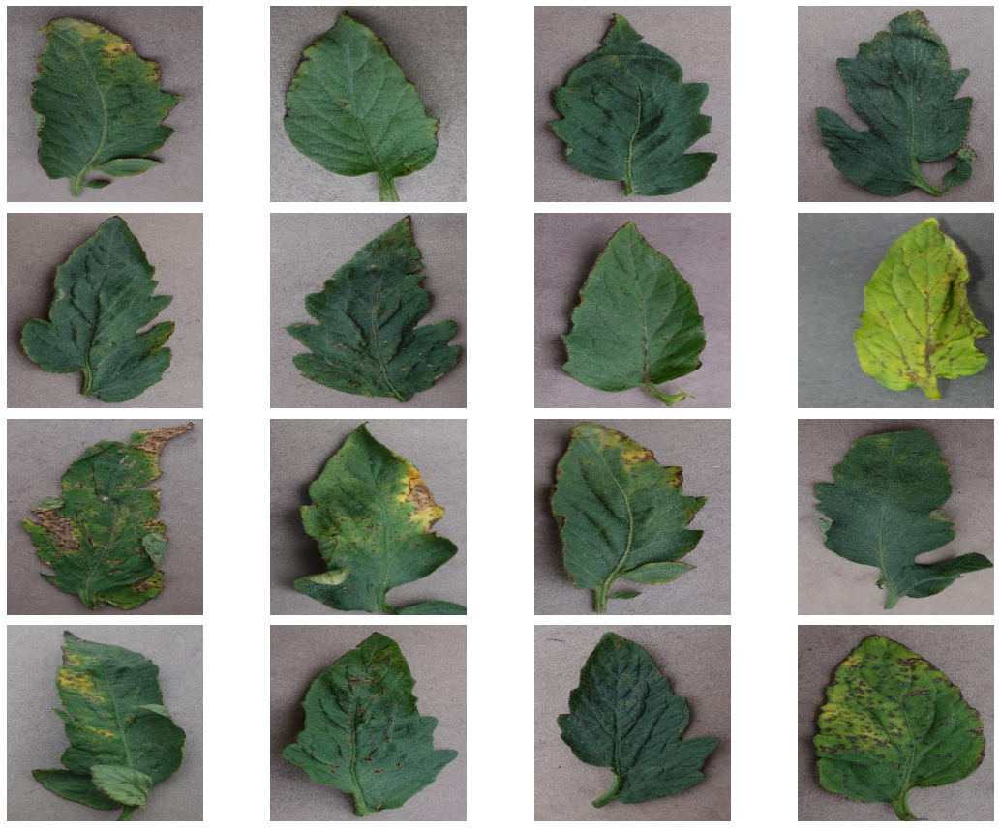

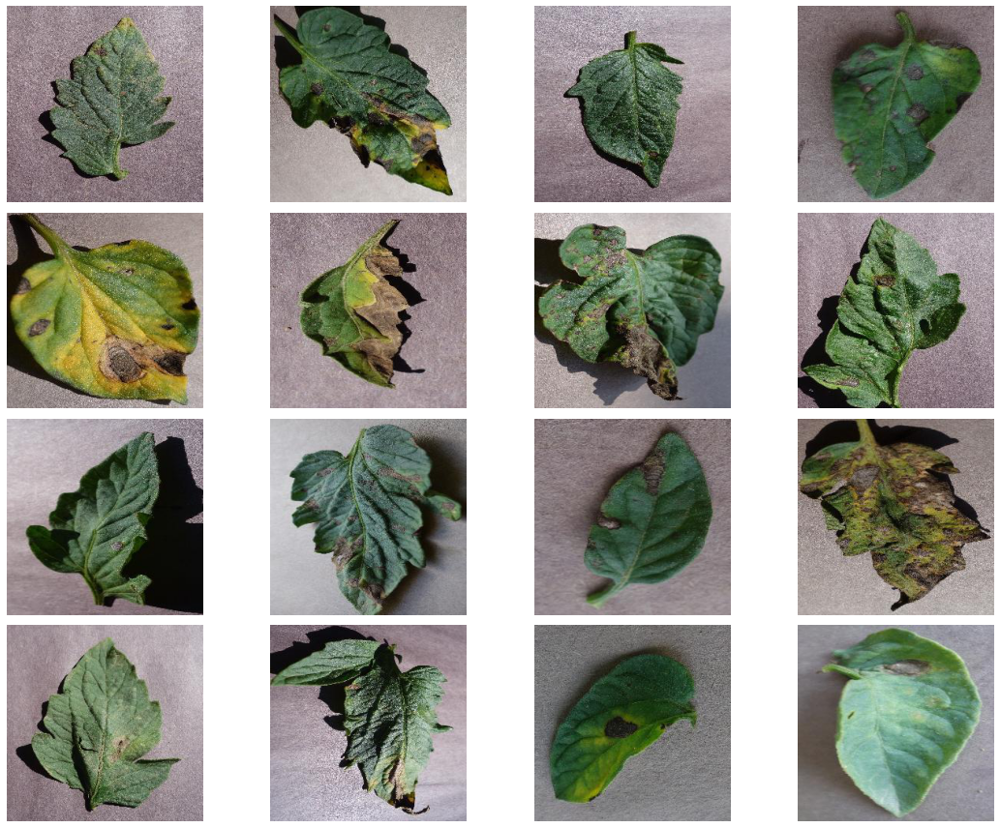

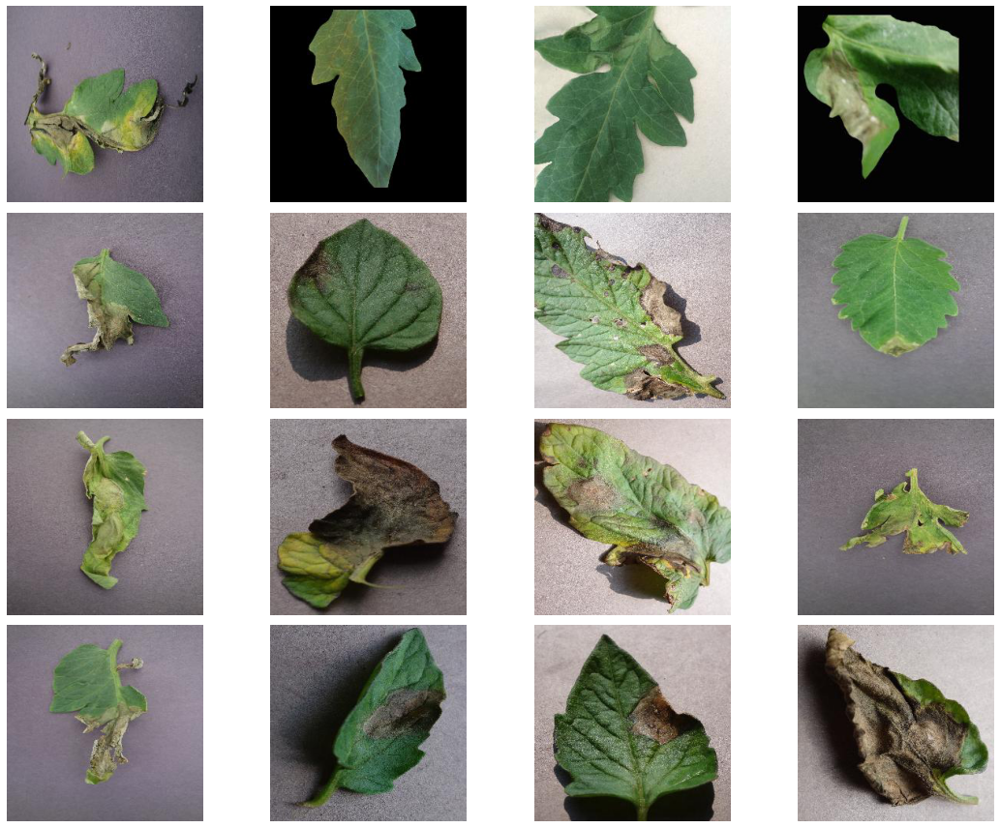

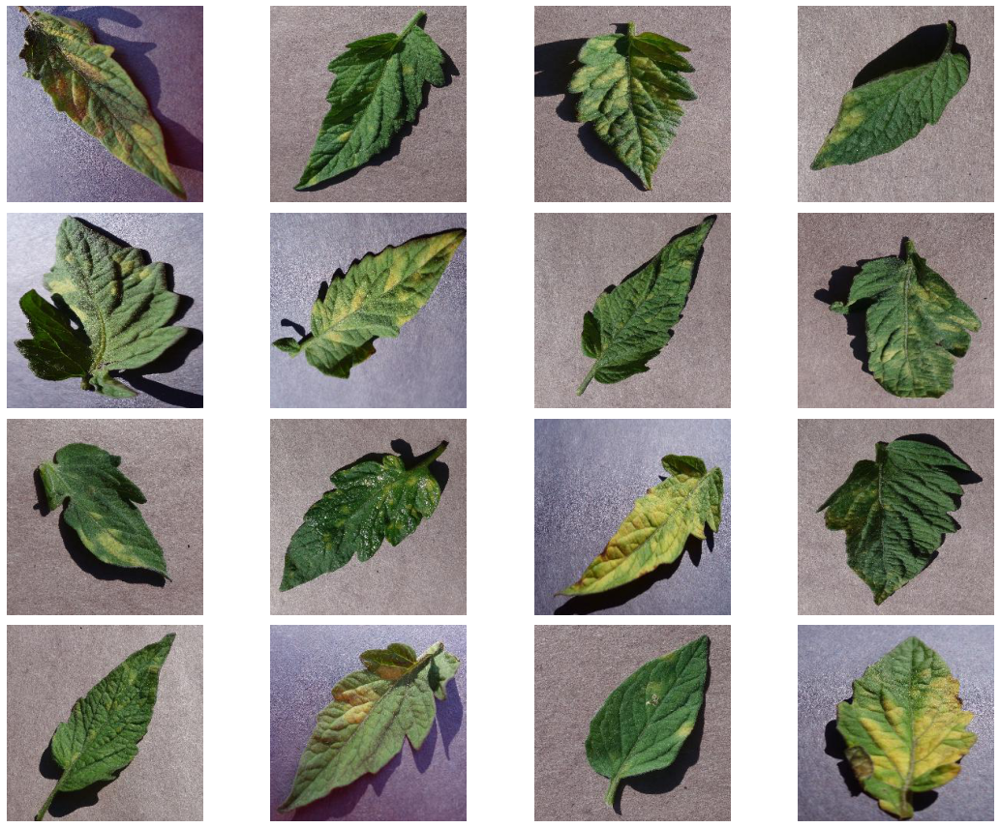

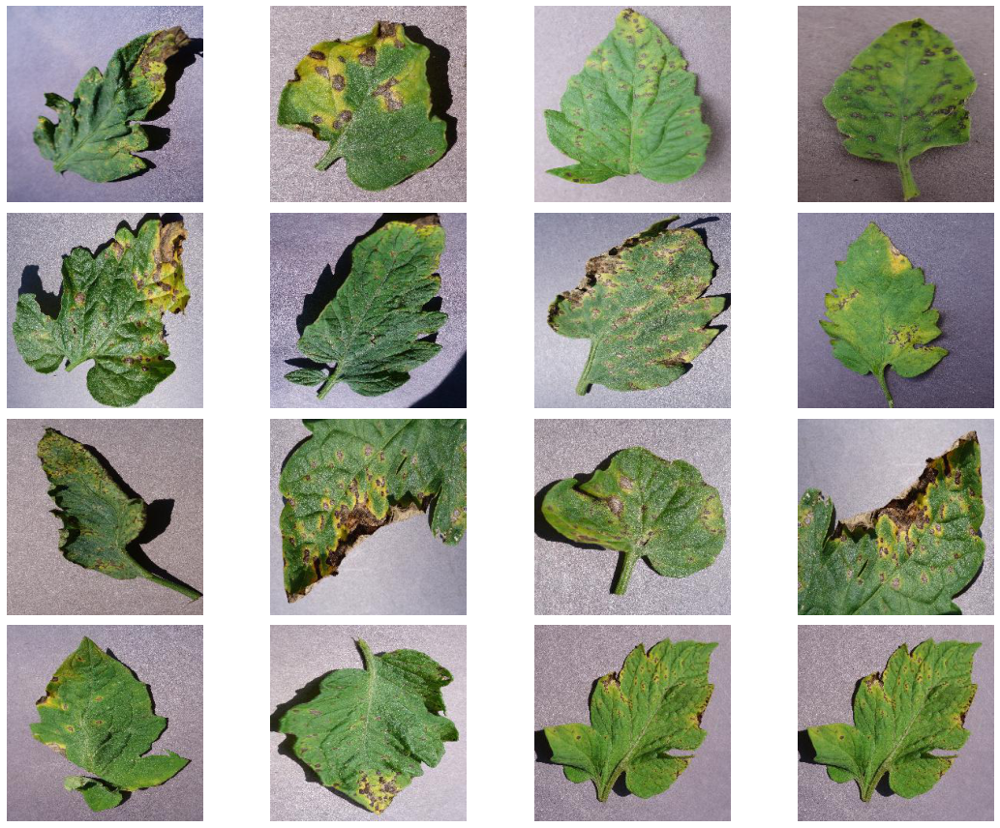

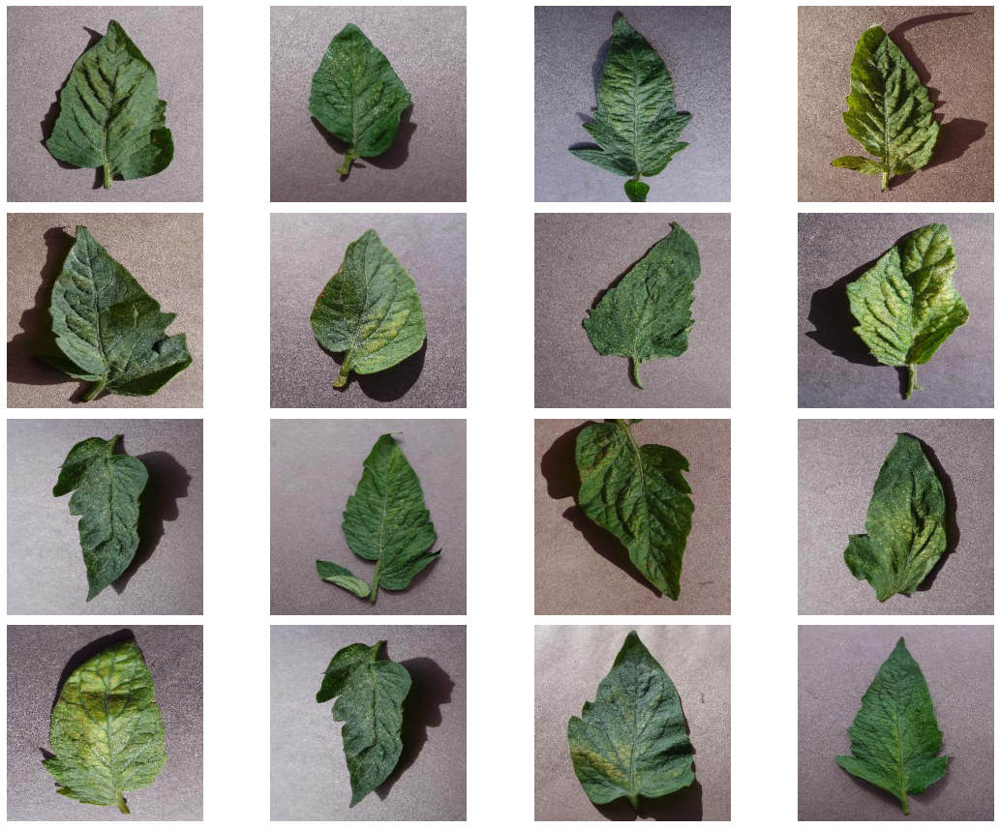

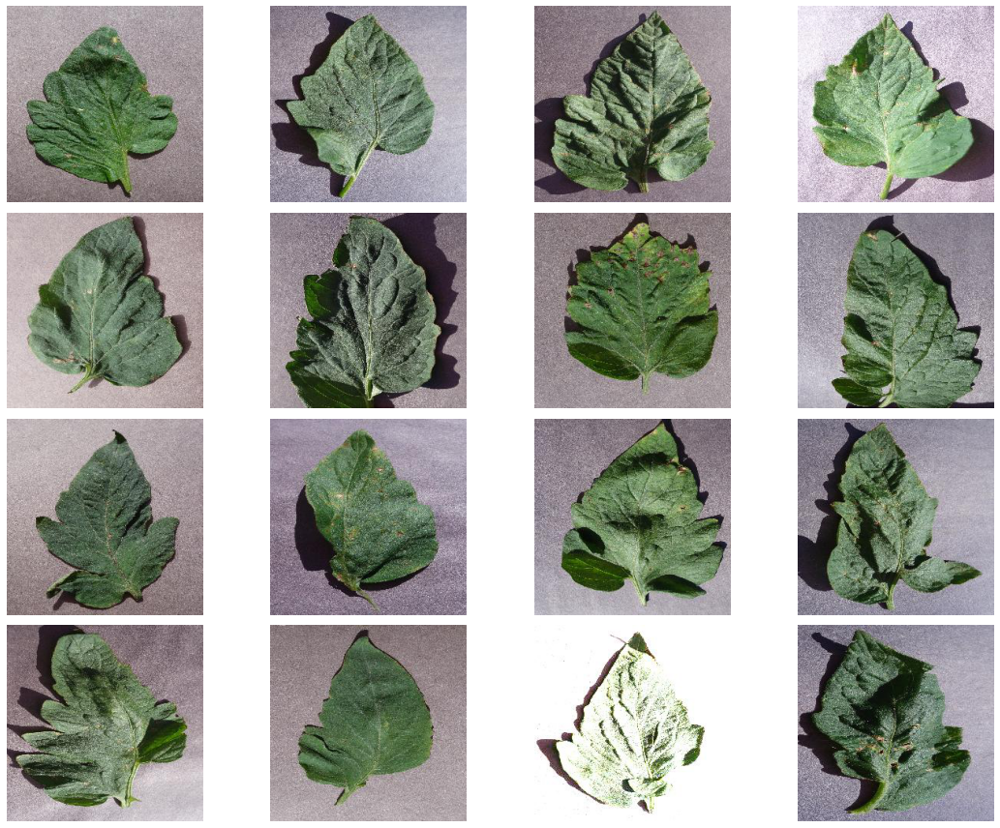

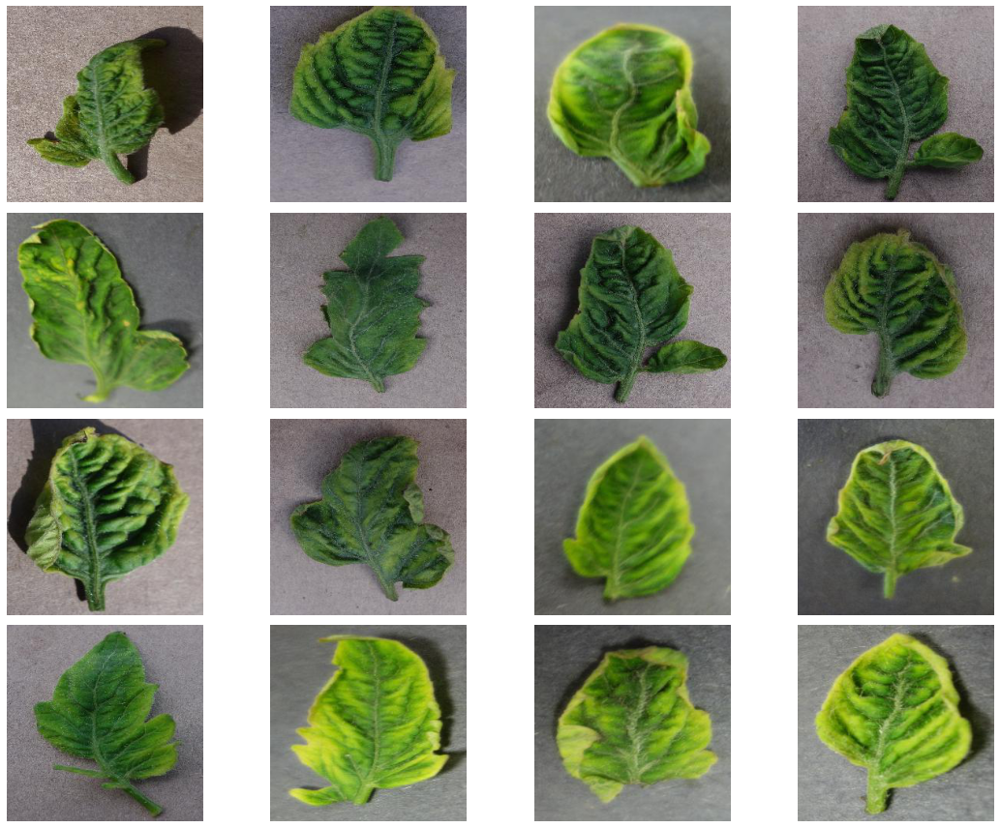

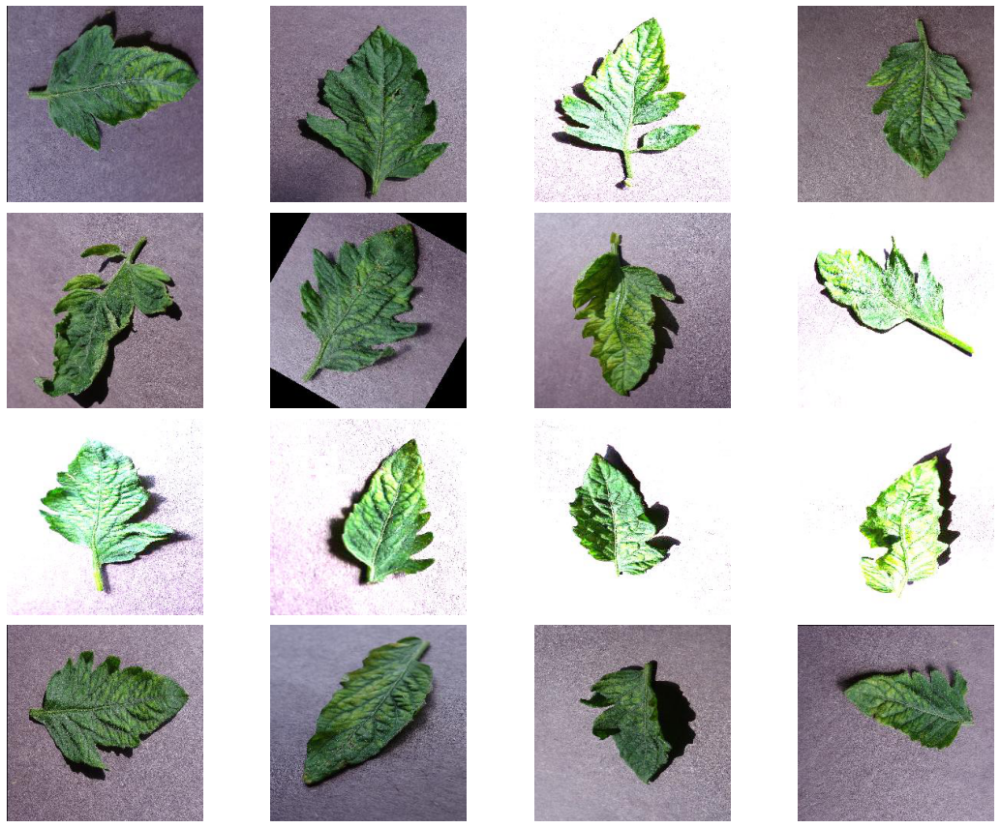

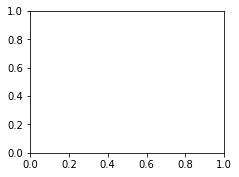

In [13]:
image_printer(df_train)

**Split the data**

In [14]:
# Split the data
def splitter(data, size):
    valid, test = train_test_split(data,
                               test_size = size,
                               random_state = RANDOM_STATE,
                               stratify = data['labels'])

    # Reset indices
    valid.reset_index(drop=True, inplace = True)
    test.reset_index(drop = True, inplace = True)

    return valid, test


In [15]:
# split the data
valid, test = splitter(df_valid, TEST_SIZE)

**Make directories for test and validation**


In [16]:
valid['labels'].unique()

array(['Tomato___Tomato_Yellow_Leaf_Curl_Virus', 'Tomato___Leaf_Mold',
       'Tomato___Target_Spot', 'Tomato___Early_blight',
       'Tomato___Tomato_mosaic_virus', 'Tomato___Septoria_leaf_spot',
       'Tomato___healthy', 'Tomato___Late_blight',
       'Tomato___Bacterial_spot',
       'Tomato___Spider_mites Two-spotted_spider_mite'], dtype=object)

In [17]:
def directory_maker(name, data):
  import shutil
  parent_dir = '/content/New Plant Diseases Dataset(Augmented)'
  path = os.path.join(parent_dir, name)
  if not os.path.exists(path):
    os.makedirs(path)
  labels = data['labels'].unique()

  for label in labels:
    label_path = os.path.join(path, label)
    if not os.path.exists(label_path):
      os.makedirs(label_path)

    df = data.loc[data['labels'] == label]
    files = df['files'].values
    for file in files:
      if not os.path.exists(os.path.join(label_path, file)):
        os.mkdir(os.path.join(label_path, file))

      shutil.copy(os.path.join(f'/content/New Plant Diseases Dataset(Augmented)/valid/{label}', 
                             file), os.path.join(label_path, file))

In [18]:
# Validation directories
directory_maker('validation', valid)

# Test directories
directory_maker('test', test)

**Visualize distribution**

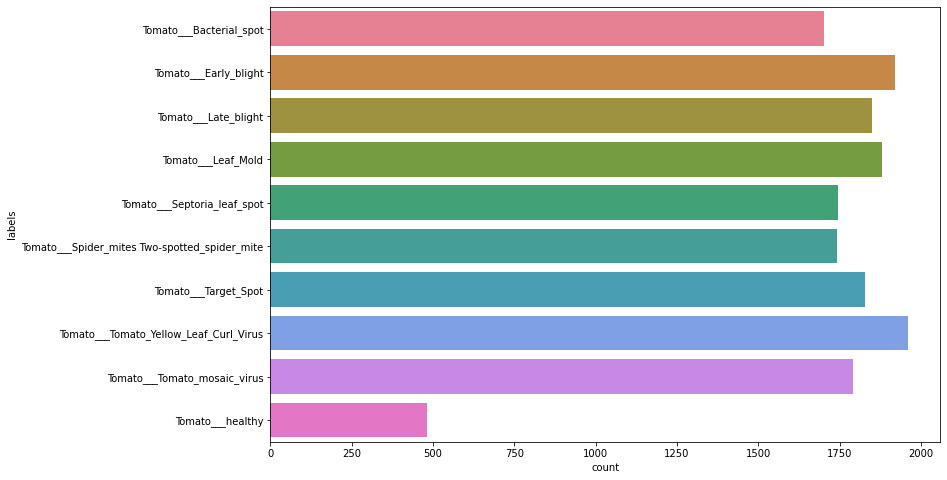

In [19]:
# Visualize the distribution of classes in train data
plt.figure(figsize=(12,8))
sns.countplot(y='labels', 
              data=df_train,
              palette='husl');

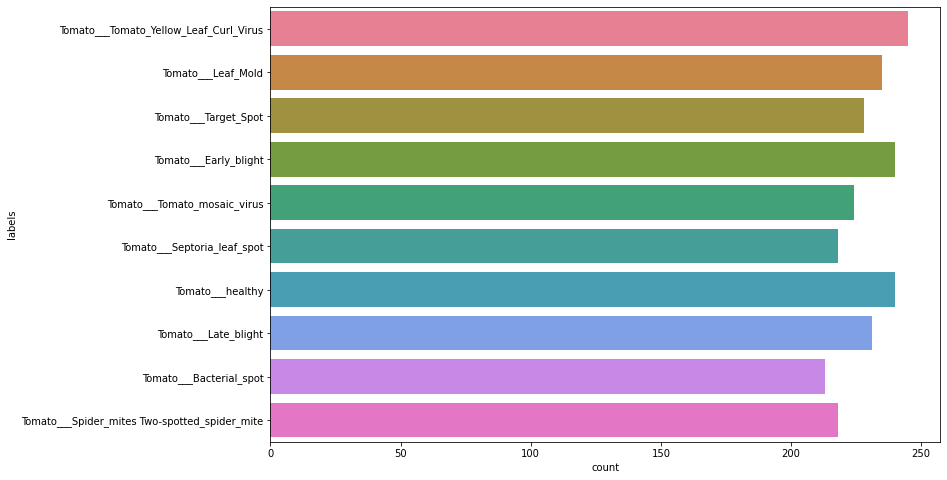

In [20]:
# Visualize validation
plt.figure(figsize=(12,8))
sns.countplot(y='labels', 
              data=valid,
              palette='husl');

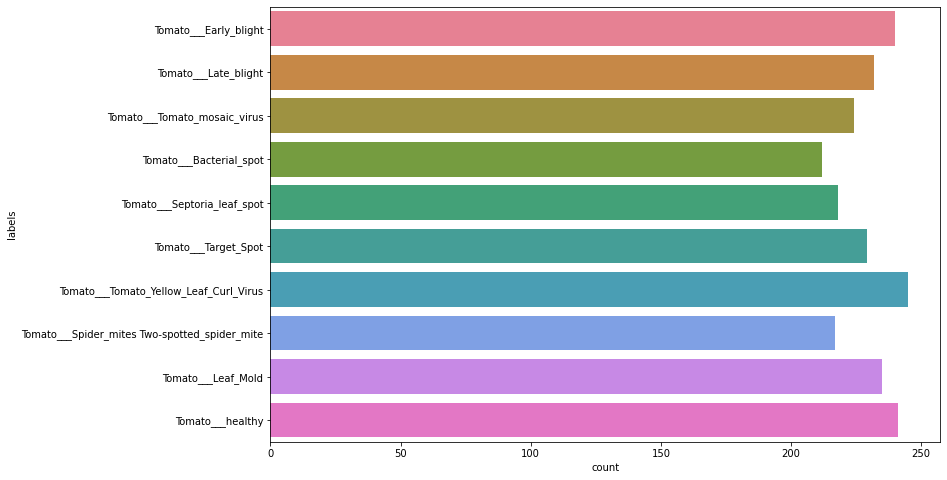

In [21]:
# Visualize test
plt.figure(figsize=(12,8))
sns.countplot(y='labels', 
              data=test,
              palette='husl');

Test and validation have the same distribution. We are good to go

**Instantiate Generators**

In [46]:
# Train generator

train_generator = ImageDataGenerator(
    horizontal_flip = True,
    vertical_flip = True,
    #brightness_range = [0.8, 1.5],
    #rotation_range = 30,
    rescale = 1./255
    #preprocessing_function = tf.keras.applications.inception_v3.preprocess_input
)

# Validation generator
valid_generator = ImageDataGenerator(
    rescale = 1./255
    #preprocessing_function = tf.keras.applications.inception_v3.preprocess_input
    )

# test generator
test_generator = ImageDataGenerator(
    rescale = 1./255
    #preprocessing_function = tf.keras.applications.inception_v3.preprocess_input
)

In [47]:
# Data generators

# Train
train_datagen = train_generator.flow_from_directory(
    '/content/New Plant Diseases Dataset(Augmented)/train',
    target_size = (TARGET_SIZE, TARGET_SIZE),
    class_mode = 'categorical', 
    batch_size = BATCH_SIZE 
)


# Validation
val_datagen = valid_generator.flow_from_directory(
    '/content/New Plant Diseases Dataset(Augmented)/validation',
    target_size = (TARGET_SIZE, TARGET_SIZE),
    class_mode = 'categorical', 
    batch_size = BATCH_SIZE 
)

# test
test_datagen = test_generator.flow_from_directory(
    '/content/New Plant Diseases Dataset(Augmented)/test',
    target_size = (TARGET_SIZE, TARGET_SIZE),
    class_mode = 'categorical', 
    batch_size = BATCH_SIZE 
)


Found 18345 images belonging to 10 classes.
Found 2292 images belonging to 10 classes.
Found 2293 images belonging to 10 classes.


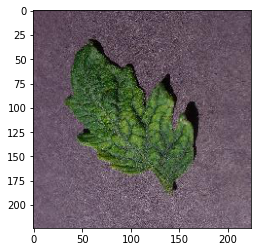

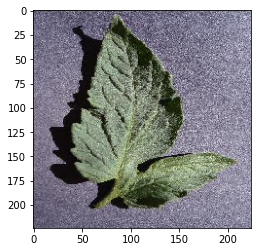

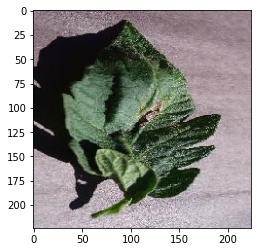

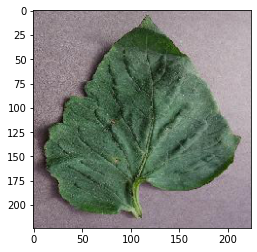

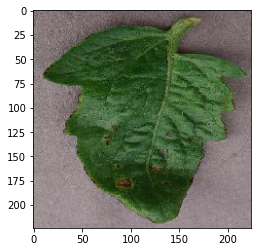

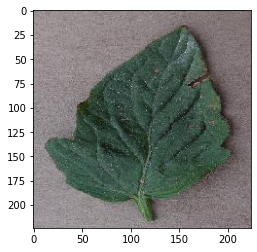

In [48]:
# Visualize an image
x_batch, y_batch = next(train_datagen)
for i in range (0,6):
    image = x_batch[i]
    plt.imshow(image)
    plt.show()

# Modelling

In [49]:
def create_model(num_classes):

  # Build model
  inception = InceptionV3(include_top=False, 
                          input_shape=(TARGET_SIZE, TARGET_SIZE, 3),
                          weights='imagenet')
  
  for layer in inception.layers:
    layer.trainable = False

  model = Sequential([
                      inception,
                      GlobalAveragePooling2D(),
                      #Flatten(),
                      Dense(256, activation = 'relu', 
                          bias_regularizer=tf.keras.regularizers.L1L2(l1=0.01, 
                                                                      l2=0.001)),
                      Dropout(0.5),
                      Dense(32, activation = 'relu',
                          bias_regularizer=tf.keras.regularizers.L1L2(l1=0.01,
                                                                      l2=0.001)),
                      Dropout(0.5),
                      Dense(num_classes, activation = 'softmax')
  ])

  # Instantiate learning rate and optimizer
  loss = tf.keras.losses.CategoricalCrossentropy(from_logits = False,
                                                   label_smoothing=0.01,
                                                   name='categorical_crossentropy' )

  adam = tf.keras.optimizers.Adam(LR)

  # Compile model
  model.compile(loss = loss,
                optimizer = adam,
                metrics = ['categorical_accuracy'])
  
  return model





In [54]:
def model_fitter():
  # Instantiate model
  model = create_model(10)

  # instantiate callbacks
  
  early_stopper = tf.keras.callbacks.EarlyStopping(monitor='val_loss',
                                                 patience=5)

  # reduce learning rate
  reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor = 'val_loss',
                                  factor = 0.1,
                                  patience = 2,
                                  min_lr = 1e-6,
                                  mode = 'min',
                                  verbose = 1)

  callbacks = [early_stopper, reduce_lr]

  # Train model
  history = model.fit(train_datagen,
                    epochs=EPOCHS,
                    steps_per_epoch=int(np.ceil(len(df_train)/BATCH_SIZE)),
                    callbacks=callbacks,
                    validation_data=val_datagen,
                    validation_steps=int(np.ceil(len(valid)/BATCH_SIZE))
                    )
  
  return history, model

In [56]:
#fit model

history, model = model_fitter()

Epoch 1/25
529/529 [==============================] - 64s 110ms/step - loss: 2.0013 - categorical_accuracy: 0.2729 - val_loss: 1.4000 - val_categorical_accuracy: 0.5912
Epoch 2/25
529/529 [==============================] - 57s 107ms/step - loss: 1.5481 - categorical_accuracy: 0.4592 - val_loss: 1.1265 - val_categorical_accuracy: 0.6915
Epoch 3/25
529/529 [==============================] - 57s 107ms/step - loss: 1.3949 - categorical_accuracy: 0.5301 - val_loss: 0.9882 - val_categorical_accuracy: 0.7325
Epoch 4/25
529/529 [==============================] - 57s 107ms/step - loss: 1.2960 - categorical_accuracy: 0.5713 - val_loss: 0.9283 - val_categorical_accuracy: 0.7583
Epoch 5/25
529/529 [==============================] - 56s 106ms/step - loss: 1.2010 - categorical_accuracy: 0.6153 - val_loss: 0.8341 - val_categorical_accuracy: 0.7753
Epoch 6/25
529/529 [==============================] - 56s 106ms/step - loss: 1.1739 - categorical_accuracy: 0.6265 - val_loss: 0.7993 - val_categorical_acc

In [35]:
def plot_interactive_figures(model_history, metric, all=True, test_data=True):
    """
    Plot the performance metrics of the model


    :param model_history: history

    The model history obtained from model.fit()

    :param metric: str
    The performance metric you want to use.**loss**, **categorical_accuracy**

    :param all: bool
    default=True. If true, overrides metric and plots figures of categorical_accuracy and loss.
    If false, plots the metric defined.

    :param test_data: bool
    default = True.
    If you have used validation data or not

    :return:
    Performance of the model
    """

    import plotly.graph_objects as go

    if all:
        if test_data:
            acc = model_history.history['categorical_accuracy']
            val_acc = model_history.history['val_categorical_accuracy']

            loss = model_history.history['loss']
            val_loss = model_history.history['val_loss']
            epochs = list(range(len(acc)+1))
            # Plots
            ax = go.Figure()
            ax.add_trace(go.Scatter(x=epochs, y=val_acc, name='Validation categorical_accuracy',
                                    line=dict(color='yellow', width=4)))
            ax.add_trace(go.Scatter(x=epochs, y=acc, name='Train categorical_accuracy',
                                    line=dict(color='blue', width=4)))
            ax.update_layout(title='Train and Validation categorical_accuracy plots',
                             xaxis_title='Epochs',
                             yaxis_title='categorical_accuracy')
            ax.show()

            bx = go.Figure()
            bx.add_trace(go.Scatter(x=epochs, y=val_loss, name='Validation Loss',
                                    line=dict(color='yellow', width=4)))
            bx.add_trace(go.Scatter(x=epochs, y=loss, name='Train Loss',
                                    line=dict(color='blue', width=4)))
            bx.update_layout(title='Train and Validation Loss plots',
                             xaxis_title='Epochs',
                             yaxis_title='Loss')
            bx.show()

        if not test_data:
            acc = model_history.history['categorical_accuracy']
            loss = model_history.history['loss']
            epochs = list(range(len(acc)+1))

            cx = go.Figure()
            cx.add_trace(go.Scatter(x=epochs, y=acc, name='categorical_accuracy',
                                    line=dict(color='blue', width=4)))
            cx.update_layout(title='categorical_accuracy plot',
                             xaxis_title='Epochs',
                             yaxis_title='categorical_accuracy')
            cx.show()

            dx = go.Figure()
            dx.add_trace(go.Scatter(x=epochs, y=loss, name='Loss',
                                    line=dict(color='yellow', width=4)))
            dx.update_layout(title='Loss plot',
                             xaxis_title='Epochs',
                             yaxis_title='Loss')
            dx.show()

    if not all:
        if test_data:
            value_train = model_history.history[metric]
            value_test = model_history.history['val_{}'.format(metric)]
            epochs = list(range(len(value_train)+1))

            ex = go.Figure()
            ex.add_trace(go.Scatter(x=epochs, y=value_test, name='Validation {}'.format(metric),
                                    line=dict(color='yellow', width=4)))
            ex.add_trace(go.Scatter(x=epochs, y=value_train, name='Train {}'.format(metric),
                                    line=dict(color='blue', width=4)))
            ex.update_layout(title='Train and Validation {} plots'.format(metric),
                             xaxis_title='Epochs',
                             yaxis_title='{}'.format(metric))
            ex.show()

        if not test_data:
            value_train = model_history.history[metric]
            epochs = list(range(len(value_train)+1))

            fx = go.Figure()
            fx.add_trace(go.Scatter(x=epochs, y=value_train, name='Train {}'.format(metric),
                                    line=dict(color='blue', width=4)))
            fx.update_layout(title='Train {} plots'.format(metric),
                             xaxis_title='Epochs',
                             yaxis_title='{}'.format(metric))
            fx.show()


In [57]:
plot_interactive_figures(history, 'categorical_accuracy')

In [58]:
# Evaluate on test data
model.evaluate(test_datagen)[1]

72/72 [==============================] - 7s 94ms/step - loss: 0.6353 - categorical_accuracy: 0.8321


0.8320977091789246

The model has a **83%** accuracy.

to improve it, hyperparameter tuning can be performed and better data augmentation techniques.